In [1]:
import glob
import operator
import os
import shutil
import subprocess
import sys
import warnings
from array import array
from collections import defaultdict, namedtuple
from copy import copy
from functools import partial, singledispatch
from itertools import chain, combinations, product
from pathlib import Path
from time import strftime

import joblib
import matplotlib.pyplot as plt
import numpy as np
import optuna
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.io as pio
import scipy.stats as stats
import seaborn as sns
import shap
from colorama import Fore, Style
from IPython.display import HTML, Image, display_html
from lightgbm import LGBMClassifier, LGBMRegressor
from plotly.subplots import make_subplots
from scipy.cluster.hierarchy import linkage
from scipy.spatial.distance import squareform
from sklearn import clone
from sklearn.base import (
    BaseEstimator,
    ClassNamePrefixFeaturesOutMixin,
    MetaEstimatorMixin,
    OneToOneFeatureMixin,
    TransformerMixin,
)
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import FeatureAgglomeration
from sklearn.compose import make_column_transformer
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.discriminant_analysis import StandardScaler
from sklearn.ensemble import (
    GradientBoostingRegressor,
    IsolationForest,
    RandomForestRegressor,
)
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.inspection import PartialDependenceDisplay
from sklearn.linear_model import LogisticRegression, SGDOneClassSVM
from sklearn.manifold import TSNE, Isomap, LocallyLinearEmbedding
from sklearn.metrics import (
    confusion_matrix,
    median_absolute_error,
    roc_auc_score,
    roc_curve,
)
from sklearn.model_selection import (
    KFold,
    StratifiedKFold,
    cross_val_predict,
    cross_val_score,
)
from sklearn.neighbors import KNeighborsRegressor, LocalOutlierFactor
from sklearn.pipeline import FunctionTransformer, make_pipeline, make_union
from sklearn.preprocessing import MinMaxScaler, PowerTransformer, RobustScaler
from sklearn.svm import SVC, SVR, LinearSVR
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.utils.validation import check_array, check_is_fitted
from xgboost import XGBClassifier


import kaleido

In [2]:
# Colorama settings.
CLR = (Style.BRIGHT + Fore.WHITE)
RED = Style.BRIGHT + Fore.RED
BLUE = Style.BRIGHT + Fore.BLUE
CYAN = Style.BRIGHT + Fore.CYAN
MAGENTA = Style.BRIGHT + Fore.MAGENTA
RESET = Style.RESET_ALL

# Data Frame and Plotly colors.
FONT_COLOR = "#4A4B52"
BACKGROUND_COLOR = "#FFFCFA"
GRADIENT_COLOR = "#BAB8B8"
# Define as numpy array because it supports fancy indexing.
COLOR_SCHEME = np.array(("#4A4B52", "#FCFCFC", "#E8BA91"))
# Ticks size for plotly and matplotlib.
TICKSIZE = 11

# Set Plotly theme.
pio.templates["minimalist"] = go.layout.Template(
    layout=go.Layout(
        font_family="Open Sans",
        font_color=FONT_COLOR,
        title_font_size=20,
        plot_bgcolor=BACKGROUND_COLOR,
        paper_bgcolor=BACKGROUND_COLOR,
        xaxis=dict(tickfont_size=TICKSIZE, titlefont_size=TICKSIZE, showgrid=False),
        yaxis=dict(tickfont_size=TICKSIZE, titlefont_size=TICKSIZE, showgrid=False),
        width=840,
        height=540,
        legend=dict(yanchor="bottom", xanchor="right", orientation="h", title=""),
    ),
    layout_colorway=COLOR_SCHEME,
)
pio.templates.default = "plotly+minimalist"

MATPLOTLIB_THEME = {
    "axes.labelcolor": FONT_COLOR,
    "axes.labelsize": TICKSIZE,
    "axes.facecolor": BACKGROUND_COLOR,
    "axes.titlesize": 14,
    "axes.grid": False,
    "xtick.labelsize": TICKSIZE,
    "xtick.color": FONT_COLOR,
    "ytick.labelsize": TICKSIZE,
    "ytick.color": FONT_COLOR,
    "figure.facecolor": BACKGROUND_COLOR,
    "figure.edgecolor": BACKGROUND_COLOR,
    "figure.titlesize": 14,
    "figure.dpi": 72,  # Locally Seaborn uses 72, meanwhile Kaggle 96.
    "text.color": FONT_COLOR,
    "font.size": TICKSIZE,
    "font.family": "Serif",
}
sns.set_theme(rc=MATPLOTLIB_THEME)

# Define Data Frame theme.
CELL_HOVER = {  # for row hover use <tr> instead of <td>
    "selector": "td:hover",
    "props": f"background-color: {BACKGROUND_COLOR}",
}
TEXT_HIGHLIGHT = {
    "selector": "td",
    "props": f"color: {FONT_COLOR}; font-weight: bold",
}
INDEX_NAMES = {
    "selector": ".index_name",
    "props": f"font-weight: normal; background-color: {BACKGROUND_COLOR}; color: {FONT_COLOR};",
}
HEADERS = {
    "selector": "th:not(.index_name)",
    "props": f"font-weight: normal; background-color: {BACKGROUND_COLOR}; color: {FONT_COLOR};",
}
DF_STYLE = (INDEX_NAMES, HEADERS, TEXT_HIGHLIGHT)
DF_CMAP = sns.light_palette(GRADIENT_COLOR, as_cmap=True)

# Html style for table of contents, code highlight and url.
HTML_STYLE = """
    <style>
    code {
        background: rgba(42, 53, 125, 0.10) !important;
        border-radius: 4px !important;
    }
    a {
        color: rgba(123, 171, 237, 1.0) !important;
    }
    ol.numbered-list {
        counter-reset: item;
    }
    ol.numbered-list li {
        display: block;
    }
    ol.numbered-list li:before {
        content: counters(item, '.') '. ';
        counter-increment: item;
    }
    </style>
"""


# Utility functions.
def download_from_kaggle(expr, /, data_dir=None):
    """Download all files from the Kaggle competition/dataset.

    Args:
        expr: Match expression to be used by kaggle API, e.g.
            "kaggle competitions download -c competition" or
            "kaggle datasets download -d user/dataset".
        data_dir: Optional. Directory path where to save files. Default to `None`,
        which means that files will be downloaded to `data` directory.

    Notes:
        If the associated files already exists, then it does nothing.
    """

    if data_dir is None:
        data_dir = Path("data/")
    else:
        data_dir = Path(data_dir)

    match expr.split():
        case ["kaggle", _, "download", *args] if args:
            data_dir.mkdir(parents=True, exist_ok=True)
            filename = args[-1].split("/")[-1] + ".zip"
            if not (data_dir / filename).is_file():
                subprocess.run(expr)
                shutil.unpack_archive(filename, data_dir)
                shutil.move(filename, data_dir)
        case _:
            raise SyntaxError("Invalid expression!")


def get_interpolated_colors(color1, color2, /, n_colors=1):
    """Return `n_colors` colors in HEX format, interpolated beetwen `color1` and `color2`.

    Args:
        color1: Initial HEX color to be interpolated from.
        color2: Final HEX color to be interpolated from.
        n_colors: Optional. Number of colors to be interpolated between `color1`
            and `color2`. Default to 1.

    Returns:
        colors: List of colors interpolated between `color1` and `color2`.
    """

    def interpolate(color1, color2, t):
        r1, g1, b1 = int(color1[1:3], 16), int(color1[3:5], 16), int(color1[5:7], 16)
        r2, g2, b2 = int(color2[1:3], 16), int(color2[3:5], 16), int(color2[5:7], 16)
        r = int(r1 + (r2 - r1) * t)
        g = int(g1 + (g2 - g1) * t)
        b = int(b1 + (b2 - b1) * t)
        return f"#{r:02X}{g:02X}{b:02X}"

    return [interpolate(color1, color2, k / (n_colors + 1)) for k in range(1, n_colors + 1)]


def get_pretty_frame(frame, /, gradient=False, formatter=None, precision=3, repr_html=False):
    stylish_frame = frame.style.set_table_styles(DF_STYLE).format(
        formatter=formatter, precision=precision
    )
    if gradient:
        stylish_frame = stylish_frame.background_gradient(DF_CMAP)  # type: ignore
    if repr_html:
        stylish_frame = stylish_frame.set_table_attributes("style='display:inline'")._repr_html_()
    return stylish_frame


def numeric_descr(frame, /):
    return (
        frame.describe(percentiles=(0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99))
        .T.drop("count", axis=1)
        .rename(columns=str.title)
    )


def frame_summary(frame, /):
    missing_vals = frame.isna().sum()
    missing_vals_ratio = missing_vals / len(frame)
    unique_vals = frame.apply(lambda col: len(col.unique()))
    most_freq_count = frame.apply(lambda col: col.value_counts().iloc[0])
    most_freq_val = frame.mode().iloc[:1].T.squeeze()
    unique_ratio = unique_vals / len(frame)
    freq_count_ratio = most_freq_count / len(frame)

    return pd.DataFrame(
        {
            "Dtype": frame.dtypes,
            "MissingValues": missing_vals,
            "MissingValuesRatio": missing_vals_ratio,
            "UniqueValues": unique_vals,
            "UniqueValuesRatio": unique_ratio,
            "MostFreqValue": most_freq_val,
            "MostFreqValueCount": most_freq_count,
            "MostFreqValueCountRatio": freq_count_ratio,
        }
    )


def check_categories_alignment(frame1, frame2, /, out_color=BLUE):
    print(CLR + "The same categories in training and test datasets?\n")
    cat_features = frame2.select_dtypes(include="object").columns.to_list()

    for feature in cat_features:
        frame1_unique = set(frame1[feature].unique())
        frame2_unique = set(frame2[feature].unique())
        same = np.all(frame1_unique == frame2_unique)
        print(CLR + f"{feature:25s}", out_color + f"{same}")


def get_lower_triangular_frame(frame, /):
    if not frame.shape[0] == frame.shape[1]:
        raise ValueError(f"{type(frame)!r} is not square frame")
    lower_triu = np.triu(np.ones_like(frame, dtype=bool))
    frame = frame.mask(lower_triu)
    return frame.dropna(axis="index", how="all").dropna(axis="columns", how="all")


def save_and_show_fig(fig, filename, /, img_dir=None, format="png"):
    if img_dir is None:
        img_dir = Path("images")
    if not isinstance(img_dir, Path):
        raise TypeError("The `img_dir` argument must be `Path` instance!")

    img_dir.mkdir(parents=True, exist_ok=True)
    fig_path = img_dir / (filename + "." + format)
    fig.write_image(fig_path)

    return Image(fig.to_image(format=format))


def get_n_rows_and_axes(n_features, n_cols, /, start_at=1):
    n_rows = int(np.ceil(n_features / n_cols))
    current_col = range(start_at, n_cols + start_at)
    current_row = range(start_at, n_rows + start_at)
    return n_rows, tuple(product(current_row, current_col))


def get_kde_estimation(
    series,
    *,
    bw_method=None,
    weights=None,
    percentile_range=(0, 100),
    estimate_points_frac=0.1,
    space_extension_frac=0.01,
    cumulative=False,
):
    """Return pdf dictionary for set of points using gaussian kernel density estimation.

    Args:
        series: The dataset with which `stats.gaussian_kde` is initialized.
        bw_method: Optional. The method used to calculate the estimator bandwidth.
        This can be 'scott', 'silverman', a scalar constant or a callable. If a scalar,
        this will be used directly as `kde.factor`. If a callable, it should take
        a `stats.gaussian_kde` instance as only parameter and return a scalar.
        If `None` (default), 'scott' is used.
        weights: Optional. Weights of datapoints. This must be the same shape as dataset.
        If `None` (default), the samples are assumed to be equally weighted.
        percentile_range: Optional. Percentile range of the `series` to create estimated space.
        By default (0, 100) range is used.
        estimate_points_frac: Optional. Fraction of `series` length to create linspace for
        estimated points.
        space_extension_frac: Optional. Estimation space will be extended by
        `space_extension_frac * len(series)` for both edges.
        cumulative: Optional. Whether to calculate cdf. Default to `False`.

    Returns:
        Dictionary with kde space, values, and cumulative values if `cumulative` is `True`.
    """

    series = pd.Series(series).dropna()
    kde = stats.gaussian_kde(series, bw_method=bw_method, weights=weights)
    start, stop = np.percentile(series, percentile_range)

    n_points = int(estimate_points_frac * len(series))
    n_extend = int(space_extension_frac * len(series))

    if n_extend > 0:
        dx = (stop - start) / (n_points - 1)
        start, stop = start - n_extend * dx, stop + n_extend * dx

    kde_space = np.linspace(start, stop, n_points)
    kde_vals = kde.evaluate(kde_space)
    results = {"space": kde_space, "vals": kde_vals}

    if cumulative:
        kde_vals_cum = np.cumsum(kde_vals)
        return results | {"vals_cumulative": kde_vals_cum / kde_vals_cum.max()}

    return results


def unit_norm(x):
    return x / np.sum(x)


# Html highlight. Must be included at the end of all imports!
HTML(HTML_STYLE)

In [3]:
train = pd.read_csv("train.csv", index_col='ID')
test = pd.read_csv("test.csv", index_col="ID")
sub = pd.read_csv("sample_submission.csv")

target = 'y'

In [5]:
get_pretty_frame(train.head())

,x_0,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
ID,,,,,,,,,,,,
TRAIN_00000,1.006,-1.963,1.248,0.927,-0.266,-1.789,0.470,-0.139,0.624,0.320,0.079,83.424
TRAIN_00001,1.025,-2.473,1.144,0.846,-0.287,-1.757,0.504,-0.220,0.698,0.238,0.082,79.374
TRAIN_00002,1.062,-2.451,1.187,0.874,-0.258,-1.803,0.498,-0.194,0.684,0.259,0.095,82.182
TRAIN_00003,1.089,-2.458,1.185,0.811,-0.277,-1.788,0.503,-0.202,0.686,0.246,0.092,83.007
TRAIN_00004,1.023,-2.133,1.242,0.940,-0.265,-1.792,0.470,-0.143,0.624,0.315,0.079,83.051


In [6]:
train.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
Index: 40118 entries, TRAIN_00000 to TRAIN_40117
Columns: 12 entries, x_0 to y
dtypes: float64(12)
memory usage: 4.0+ MB


In [ ]:
fig = px.histogram(
    train,
    x="y",
    histnorm="probability",
    marginal="box",
    height=460,
    title="Distribution of y - Target Variable<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "This feature seems like a quantized one (many repetitive values)</span>",
)
fig.update_yaxes(title="Probability", row=1)
save_and_show_fig(fig, "hardness_distribution")

In [8]:
print(CLR + "Training Dataset:")
train_summary = frame_summary(train)
get_pretty_frame(train_summary, gradient=True)

Training Dataset:


,Dtype,MissingValues,MissingValuesRatio,UniqueValues,UniqueValuesRatio,MostFreqValue,MostFreqValueCount,MostFreqValueCountRatio
x_0,float64,0,0.000,40118,1.000,0.908,1,0.000
x_1,float64,0,0.000,40118,1.000,-2.548,1,0.000
x_2,float64,0,0.000,40118,1.000,1.056,1,0.000
x_3,float64,0,0.000,40118,1.000,0.742,1,0.000
x_4,float64,0,0.000,40118,1.000,-0.581,1,0.000
x_5,float64,0,0.000,40118,1.000,-1.817,1,0.000
x_6,float64,0,0.000,40118,1.000,0.464,1,0.000
x_7,float64,0,0.000,40118,1.000,-0.231,1,0.000
x_8,float64,0,0.000,40118,1.000,0.575,1,0.000
x_9,float64,0,0.000,40118,1.000,0.223,1,0.000


In [9]:
print(CLR + "Test Dataset:")
test_summary = frame_summary(test)
get_pretty_frame(test_summary, gradient=True)

Test Dataset:


,Dtype,MissingValues,MissingValuesRatio,UniqueValues,UniqueValuesRatio,MostFreqValue,MostFreqValueCount,MostFreqValueCountRatio
x_0,float64,0,0.000,4986,1.000,0.907,1,0.000
x_1,float64,0,0.000,4986,1.000,-2.548,1,0.000
x_2,float64,0,0.000,4986,1.000,1.057,1,0.000
x_3,float64,0,0.000,4986,1.000,0.744,1,0.000
x_4,float64,0,0.000,4986,1.000,-0.581,1,0.000
x_5,float64,0,0.000,4986,1.000,-1.817,1,0.000
x_6,float64,0,0.000,4986,1.000,0.464,1,0.000
x_7,float64,0,0.000,4986,1.000,-0.231,1,0.000
x_8,float64,0,0.000,4986,1.000,0.575,1,0.000
x_9,float64,0,0.000,4986,1.000,0.224,1,0.000


In [10]:
print(CLR + "Training Dataset:")
train_num_descr = numeric_descr(train)
get_pretty_frame(train_num_descr, gradient=True)

Training Dataset:


,Mean,Std,Min,1%,5%,25%,50%,75%,95%,99%,Max
x_0,1.048,0.040,0.908,0.931,0.964,1.029,1.055,1.076,1.101,1.109,1.113
x_1,-2.205,0.310,-2.548,-2.535,-2.511,-2.427,-2.330,-2.061,-1.530,-1.231,-0.971
x_2,1.202,0.037,1.056,1.115,1.131,1.176,1.213,1.231,1.246,1.251,1.254
x_3,0.869,0.049,0.742,0.761,0.784,0.833,0.871,0.908,0.942,0.956,0.965
x_4,-0.278,0.039,-0.581,-0.461,-0.353,-0.285,-0.266,-0.256,-0.248,-0.245,-0.243
x_5,-1.776,0.043,-1.817,-1.815,-1.813,-1.806,-1.790,-1.760,-1.683,-1.602,-1.545
x_6,0.488,0.016,0.464,0.465,0.468,0.474,0.488,0.500,0.509,0.537,0.585
x_7,-0.168,0.037,-0.231,-0.225,-0.219,-0.197,-0.174,-0.146,-0.096,-0.072,-0.055
x_8,0.653,0.038,0.575,0.578,0.583,0.623,0.664,0.688,0.696,0.698,0.700
x_9,0.289,0.043,0.223,0.227,0.232,0.253,0.282,0.318,0.368,0.399,0.428


In [11]:
print(CLR + "Test Dataset:")
test_num_descr = numeric_descr(test)
get_pretty_frame(test_num_descr, gradient=True)

Test Dataset:


,Mean,Std,Min,1%,5%,25%,50%,75%,95%,99%,Max
x_0,1.033,0.053,0.907,0.915,0.930,0.995,1.048,1.073,1.099,1.108,1.112
x_1,-2.057,0.468,-2.548,-2.535,-2.506,-2.409,-2.289,-1.756,-1.124,-1.031,-0.974
x_2,1.188,0.046,1.057,1.073,1.099,1.156,1.200,1.227,1.244,1.250,1.253
x_3,0.878,0.051,0.744,0.762,0.788,0.840,0.881,0.922,0.951,0.959,0.964
x_4,-0.310,0.085,-0.581,-0.561,-0.519,-0.304,-0.271,-0.257,-0.248,-0.245,-0.243
x_5,-1.748,0.079,-1.817,-1.815,-1.813,-1.805,-1.782,-1.735,-1.571,-1.553,-1.545
x_6,0.498,0.027,0.464,0.466,0.468,0.478,0.494,0.505,0.561,0.581,0.589
x_7,-0.154,0.050,-0.231,-0.225,-0.218,-0.193,-0.168,-0.116,-0.064,-0.058,-0.055
x_8,0.643,0.044,0.575,0.577,0.579,0.594,0.654,0.686,0.696,0.698,0.700
x_9,0.305,0.058,0.224,0.227,0.233,0.257,0.291,0.348,0.413,0.424,0.429


In [12]:
train_av = train.drop("y", axis=1).assign(AV=0)
test_av = test.assign(AV=1)

data_av = pd.concat((train_av, test_av), ignore_index=True)
data_av = data_av.sample(frac=1.0, random_state=42)

X = data_av.drop("AV", axis=1)
y = data_av.AV

y_proba = cross_val_predict(
    estimator=make_pipeline(StandardScaler(), LogisticRegression(random_state=42)),
    X=X,
    y=y,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=19937),
    method="predict_proba",
)

av_scores = {
    "ConfusionMatrix": confusion_matrix(y, y_proba.argmax(axis=1)),
    "FPR-TPR-Threshold": roc_curve(y, y_proba[:, 1]),
    "ROC-AUC": roc_auc_score(y, y_proba[:, 1]),
}

In [ ]:
fig = go.Figure()
fig.add_scatter(
    x=av_scores["FPR-TPR-Threshold"][0],
    y=av_scores["FPR-TPR-Threshold"][1],
    name="AV Result",
    mode="lines",
    line_color=COLOR_SCHEME[2],
)
fig.add_scatter(
    x=[0, 1],
    y=[0, 1],
    name="Random Guess",
    mode="lines",
    line=dict(dash="longdash", color=COLOR_SCHEME[0]),
)
fig.add_annotation(
    x=0.05,
    y=0.85,
    align="left",
    xanchor="left",
    text=f"<b>AV ROC-AUC: {av_scores['ROC-AUC']:.5f}<br>",
    showarrow=False,
    font_size=14,
)
fig.update_yaxes(
    scaleanchor="x",
    scaleratio=1,
    range=(-0.01, 1.01),
    title="True Positive Rate (Recall)",
)
fig.update_xaxes(
    scaleanchor="y",
    scaleratio=1,
    range=(-0.01, 1.01),
    title="False Positive Rate (Fall-Out)",
)
fig.update_layout(
    title="Adversarial Validation Results<br>"
    "<span style='font-size: 75%; font-weight: bold;'>",
    width=540,
    legend=dict(y=1.0, x=1.2),
)
save_and_show_fig(fig, "adversarial_validation")

In [ ]:
features = test.columns.to_list()

n_cols = 3
n_rows, axes = get_n_rows_and_axes(len(features), n_cols)

fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    y_title="Probability Density",
    horizontal_spacing=0.1,
    vertical_spacing=0.1,
).update_annotations(font_size=14)

for frame, color, group in zip((train, test), (COLOR_SCHEME[0], COLOR_SCHEME[2]), ("Train", "Test")):
    for k, (var, (row, col)) in enumerate(zip(features, axes), start=1):
        start, end = np.percentile(frame[var], (1, 99))
        fig.add_histogram(
            x=frame[var],
            xbins=go.histogram.XBins(start=start, end=end),
            histnorm="probability density",
            marker_color=color,
            marker_line_width=0,
            opacity=0.8,
            name=group,
            legendgroup=group,
            showlegend=k == 1,
            row=row,
            col=col,
        )
        fig.update_xaxes(title_text=f"<b>{var}</b>", row=row, col=col)

fig.update_layout(
    width=840,
    height=740,
    legend=dict(y=1, x=1),
    title="Training & Test Feature Histograms<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "Restricted to (1, 99) percentile range to avoid showing extreme outliers</span>",
    bargap=0,
    bargroupgap=0,
)
save_and_show_fig(fig, "histograms")

In [ ]:
n_cols = 3
n_rows, axes = get_n_rows_and_axes(len(features), n_cols)

fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    y_title="Probability Density",
    horizontal_spacing=0.1,
    vertical_spacing=0.1,
).update_annotations(font_size=14)

for frame, color, group in zip((train, test), (COLOR_SCHEME[0], COLOR_SCHEME[2]), ("Train", "Test")):
    for k, (var, (row, col)) in enumerate(zip(features, axes), start=1):
        kde = get_kde_estimation(frame[var], percentile_range=(1, 99))
        fig.add_scatter(
            x=kde["space"],
            y=kde["vals"],
            line=dict(dash="solid", color=color, width=1),
            fill="tozeroy",
            name=group,
            legendgroup=group,
            showlegend=k == 1,
            row=row,
            col=col,
        )
        fig.update_xaxes(title_text=f"<b>{var}</b>", row=row, col=col)

fig.update_layout(
    width=840,
    height=740,
    legend=dict(y=1, x=1),
    title="Training & Test Feature KDEs<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "Restricted to (1, 99) percentile range to avoid showing extreme outliers</span>",
)
save_and_show_fig(fig, "kdes")

In [ ]:
pearson_corr = train.corr(method="pearson")
lower_triu_corr = get_lower_triangular_frame(pearson_corr)
colormap = tuple(zip((0, 0.5, 1), COLOR_SCHEME[[1, 0, 2]]))

heatmap = go.Heatmap(
    z=lower_triu_corr,
    x=lower_triu_corr.columns,
    y=lower_triu_corr.index,
    text=lower_triu_corr.fillna(""),
    texttemplate="%{text:.2f}",
    xgap=4,
    ygap=4,
    showscale=True,
    colorscale=colormap,
    colorbar_len=1.02,
    hoverinfo="none",
)
fig = go.Figure(heatmap)
fig.update_layout(
    title="Training Dataset - Lower Triangle of Correlation Matrix (Pearson)<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "Here we have several strongly correlated features. "
    "Are they really correlated or it's impact of outliers?</span>",
    yaxis_autorange="reversed",
    width=1000,
    height=840,
)
save_and_show_fig(fig, "pearson_corr_matrix")

In [19]:
abs_corr = (
    lower_triu_corr.abs()
    .unstack()
    .sort_values(ascending=False)  # type: ignore
    .rename("Absolute Pearson Correlation")
    .to_frame()
    .reset_index(names=["Feature 1", "Feature 2"])
    .dropna()
    .round(5)
)

with pd.option_context("display.max_rows", 10):
    print(abs_corr)

   Feature 1 Feature 2  Absolute Pearson Correlation
0        x_7       x_9                       0.99188
1        x_8       x_9                       0.98251
2        x_7       x_8                       0.97396
3        x_4       x_5                       0.96774
4        x_5      x_10                       0.95890
..       ...       ...                           ...
61       x_1       x_6                       0.12681
62       x_2         y                       0.11897
63       x_0       x_2                       0.06802
64       x_0       x_6                       0.04503
65       x_6         y                       0.01363

[66 rows x 3 columns]


In [ ]:
dissimilarity = 1 - np.abs(pearson_corr)

fig = ff.create_dendrogram(
    dissimilarity,
    labels=pearson_corr.columns,
    orientation="left",
    colorscale=px.colors.sequential.Greys[3:],
    # squareform() returns lower triangular in compressed form - as 1D array.
    linkagefun=lambda x: linkage(squareform(dissimilarity), method="complete"),
)
fig.update_xaxes(showline=False, title="Distance", ticks="", range=[-0.03, 1.05])
fig.update_yaxes(showline=False, ticks="")
fig.update_layout(
    title="Training Dataset - Hierarchical Clustering using Correlation Matrix (Pearson)<br>"
    "<span style='font-size: 75%; font-weight: bold;'>",
    height=460,
    width=840,
)
fig.update_traces(line_width=1.5, opacity=1)
save_and_show_fig(fig, "hierarchical_clustering")

In [ ]:
n_cols, n_features = 3, 6
n_rows, axes = get_n_rows_and_axes(n_features, n_cols)

fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    horizontal_spacing=0.1,
    vertical_spacing=0.15,
)

for (row, col), (feature1, feature2, corr) in zip(axes, abs_corr[:n_features].to_numpy()):
    fig.add_scatter(
        x=train[feature1],
        y=train[feature2],
        mode="markers",
        name="",
        row=row,
        col=col,
    )
    fig.update_xaxes(title_text=feature1, row=row, col=col)
    fig.update_yaxes(title_text=feature2, row=row, col=col)

fig.update_layout(
    title="Training Dataset - Highly Linear Correlated Pairs<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "Actual high correlation corresponds to the first pair only (perhaps the second too)</span>",
    width=840,
    height=540,
    showlegend=False,
)
fig.update_traces(
    marker=dict(size=1, symbol="x-thin", line=dict(width=1.5, color=COLOR_SCHEME[0])),
)
save_and_show_fig(fig, "highly_correlated_scatter_plots")

In [ ]:
n_cols = 3
n_rows, axes = get_n_rows_and_axes(len(features), n_cols)

fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    y_title="y - Target Variable",
    horizontal_spacing=0.07,
    vertical_spacing=0.1,
)
fig.update_annotations(font_size=14, yshift=-45)

for (row, col), feature in zip(axes, features):
    fig.add_scatter(
        x=train[feature],
        y=train.y,
        mode="markers",
        name=feature,
        row=row,
        col=col,
    )
    fig.update_xaxes(
        title_text=f"<b>{feature}</b>",
        row=row,
        col=col,
    )
    if not col == 1:
        fig.update_yaxes(showticklabels=False, row=row, col=col)

fig.update_layout(
    title="Training Dataset - y vs Remaining Features<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "Lack of clear dependencies at first sight</span>",
    width=1000,
    height=840,
    showlegend=False,
)
fig.update_traces(
    marker=dict(size=1, symbol="x-thin", line=dict(width=1.5, color=COLOR_SCHEME[0])),
)
fig.show()
#save_and_show_fig(fig, "scatter_plots")


In [ ]:
n_cols = 3
n_rows, axes = get_n_rows_and_axes(len(features), n_cols)

fig = make_subplots(
    rows=n_rows,
    cols=n_cols,
    y_title="Observed Values",
    x_title="Theoretical Quantiles",
    horizontal_spacing=0.1,
    vertical_spacing=0.1,
)
fig.update_annotations(font_size=14, yshift=-45)

for (row, col), feature in zip(axes, features):
    (osm, osr), (slope, intercept, R) = stats.probplot(train[feature].dropna(), rvalue=True)
    x_theory = np.array([osm[0], osm[-1]])
    y_theory = intercept + slope * x_theory
    R2 = f"R\u00b2 = {R * R:.2f}"
    fig.add_scatter(x=osm, y=osr, mode="markers", row=row, col=col, name=feature)
    fig.add_scatter(x=x_theory, y=y_theory, mode="lines", row=row, col=col)
    fig.add_annotation(
        x=-1.25,
        y=osr[-1] * 0.95,
        text=R2,
        showarrow=False,
        row=row,
        col=col,
        font_size=11,
    )
    fig.update_xaxes(
        title_text=f"<b>{feature}</b>",
        row=row,
        col=col,
    )

fig.update_layout(
    title="Training Dataset - Probability Plots against Normal Distribution<br>"
    "<span style='font-size: 75%; font-weight: bold;'>",
    width=1000,
    height=840,
    showlegend=False,
)
fig.update_traces(
    marker=dict(size=1, symbol="x-thin", line=dict(width=2, color=COLOR_SCHEME[2])),
    line_color=COLOR_SCHEME[0],
)
fig.show()
#save_and_show_fig(fig, "probability_plots")

In [27]:
r2_scores = pd.DataFrame(index=("Original", "YeoJohnson", "Log", "Sqrt"))

for feature in features:
    orig = train[feature].dropna()
    _, (*_, R_orig) = stats.probplot(orig, rvalue=True)
    _, (*_, R_yeojohn) = stats.probplot(stats.yeojohnson(orig)[0], rvalue=True)
    _, (*_, R_log) = stats.probplot(np.log1p(orig), rvalue=True)
    _, (*_, R_sqrt) = stats.probplot(np.sqrt(orig), rvalue=True)

    r2_scores[feature] = (
        R_orig * R_orig,
        R_yeojohn * R_yeojohn,
        R_log * R_log,
        R_sqrt * R_sqrt,
    )

r2_scores = r2_scores.transpose()
r2_scores["Winner"] = r2_scores.idxmax(axis=1)
get_pretty_frame(r2_scores)

/home/ubuntu01/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

invalid value encountered in log1p

/home/ubuntu01/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

invalid value encountered in sqrt

/home/ubuntu01/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

invalid value encountered in sqrt

/home/ubuntu01/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

invalid value encountered in log1p

/home/ubuntu01/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

invalid value encountered in sqrt

/home/ubuntu01/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

invalid value encountered in sqrt

/home/ubuntu01/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning:

invalid value encountered in sqrt



,Original,YeoJohnson,Log,Sqrt,Winner
x_0,0.936,0.990,0.931,0.931,YeoJohnson
x_1,0.846,0.945,nan,nan,YeoJohnson
x_2,0.920,0.959,0.917,0.917,YeoJohnson
x_3,0.981,0.984,0.980,0.980,YeoJohnson
x_4,0.653,0.969,0.600,nan,YeoJohnson
x_5,0.770,0.947,nan,nan,YeoJohnson
x_6,0.923,0.955,0.926,0.928,YeoJohnson
x_7,0.958,0.985,0.966,nan,YeoJohnson
x_8,0.898,0.916,0.896,0.895,YeoJohnson
x_9,0.953,0.973,0.957,0.962,YeoJohnson


In [37]:
x_8_transformed = stats.yeojohnson(train.x_8.dropna())[0]
(osm, osr), (slope, intercept, R) = stats.probplot(x_8_transformed, rvalue=True)
x_theory = np.array([osm[0], osm[-1]])
y_theory = intercept + slope * x_theory

fig = make_subplots(
    rows=1,
    cols=2,
    subplot_titles=["Probability Plot against Normal Distribution", "Distribution"],
    horizontal_spacing=0.15,
)

fig.add_scatter(x=osm, y=osr, mode="markers", row=1, col=1, name="YeoJohnson(x_8)")
fig.add_scatter(x=x_theory, y=y_theory, mode="lines", row=1, col=1)
fig.add_annotation(
    x=-1.25,
    y=osr[-1] * 0.75,
    text=f"R\u00b2 = {R * R:.3f}",
    showarrow=False,
    row=1,
    col=1,
)
fig.update_yaxes(title_text="Observed Values", row=1, col=1)
fig.update_xaxes(title_text="Theoretical Quantiles", row=1, col=1)
fig.update_traces(
    marker=dict(size=1, symbol="x-thin", line=dict(width=2, color=COLOR_SCHEME[2])),
    line_color=COLOR_SCHEME[0],
)

fig.add_histogram(
    x=x_8_transformed,
    xbins=go.histogram.XBins(size=0.1),
    marker_color=COLOR_SCHEME[0],
    name="YeoJohnson(x_8)",
    histnorm="probability density",
    row=1,
    col=2,
)
fig.update_yaxes(title_text="Probability Density", row=1, col=2)
fig.update_xaxes(title_text="YeoJohnson(x_8)", row=1, col=2)

fig.update_layout(
    title="Yeo-Johnson Transformation for 'x_8' Feature",
    showlegend=False,
    width=840,
    height=460,
    bargap=0.2,
)
fig.update_annotations(font_size=14)
fig.show()
#save_and_show_fig(fig, "x_8_after_transform")

In [30]:
X = train.drop("y", axis=1)
y = train.y

DefaultDecisionTreeRegressor = partial(
    DecisionTreeRegressor,
    criterion="absolute_error",  # Watch out on learning time complexity.
    random_state=42,
    max_depth=3,
)

tree = DefaultDecisionTreeRegressor().fit(X, y)

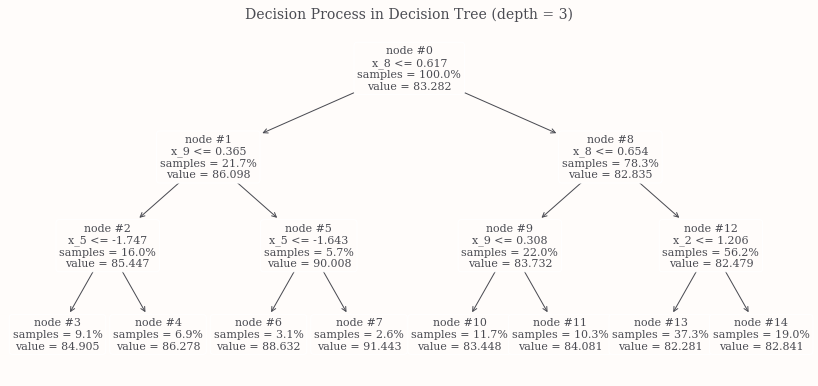

In [31]:
plt.figure(figsize=(11.5, 5.5), tight_layout=True)
plot_tree(
    decision_tree=tree,
    feature_names=tree.feature_names_in_.tolist(),
    filled=False,
    rounded=True,
    impurity=False,
    proportion=True,
    node_ids=True,
    ax=plt.gca(),
    fontsize=11,
)
plt.title("Decision Process in Decision Tree (depth = 3)")
plt.savefig("images/decision_process_in_tree")
plt.show()

In [32]:
for depth in range(2, 7):
    tree.set_params(max_depth=depth).fit(X, y)
    considered_features = tree.tree_.feature[tree.tree_.feature != -2]  # type: ignore # -2 means a leaf
    used_features = np.unique(considered_features)
    used_features = X.columns[used_features].to_list()
    print(CLR + f"Features at depth {depth}: {RED}{len(used_features):<5}", end="")
    tree_cv_results = -cross_val_score(
        estimator=tree,
        X=X,
        y=y,
        cv=KFold(n_splits=5, shuffle=True, random_state=42),
        scoring="neg_median_absolute_error",
        n_jobs=2,
    )
    mean, std = tree_cv_results.mean(), tree_cv_results.std()
    print(CLR + "MedAE:", RED + f"{mean:.2f} \u00b1 {std:.2f}")

Features at depth 2: 2    MedAE: 0.97 ± 0.01
Features at depth 3: 4    MedAE: 0.95 ± 0.01
Features at depth 4: 7    MedAE: 0.93 ± 0.01
Features at depth 5: 9    MedAE: 0.93 ± 0.01
Features at depth 6: 11   MedAE: 0.93 ± 0.01


In [5]:
DefaultLGBMRegressor = partial(
    LGBMRegressor,
    objective="regression_l1",
    random_state=42,
    verbose=-1,
)

In [34]:
np.random.seed(42)
seeds = np.random.randint(0, 19937, size=5)

X = train.drop("y", axis=1)
y = train.y

lgbm = DefaultLGBMRegressor()
importances = []

for seed in seeds:
    np.random.seed(seed)
    X["RANDOM_1"] = np.random.normal(size=len(X))
    X["RANDOM_2"] = np.random.normal(size=len(X))
    X["RANDOM_3"] = np.random.normal(size=len(X))
    X["RANDOM_4"] = np.random.normal(size=len(X))
    X["RANDOM_5"] = np.random.normal(size=len(X))

    lgbm.set_params(random_state=seed).fit(X, y)
    importances.append(unit_norm(lgbm.feature_importances_))

importances = (
    pd.DataFrame({"Feature": X.columns, "Importance": np.array(importances).mean(axis=0)})
    .sort_values(by="Importance", ascending=False)
    .reset_index(drop=True)
)

In [40]:
fig = px.bar(
    importances,
    x="Importance",
    y="Feature",
    height=460,
    width=840,
    title="Feature Importances in LGBM Regressor - Under Reduction in MAE Criterion<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "Used a default version of LGBM with L1 objective. ",
)
fig.update_yaxes(categoryorder="total ascending", title="")
fig.update_xaxes(range=(-0.002, 0.11))
fig.update_traces(width=0.7)
fig.show()
#save_and_show_fig(fig, "importance_with_mae_reduction")

In [41]:
np.random.seed(42)
seeds = np.random.randint(0, 19937, size=5)

lgbm = DefaultLGBMRegressor()
permutation_medae = defaultdict(list)

for seed in seeds:
    np.random.seed(seed)
    X["RANDOM_1"] = np.random.normal(size=len(X))
    X["RANDOM_2"] = np.random.normal(size=len(X))
    X["RANDOM_3"] = np.random.normal(size=len(X))
    X["RANDOM_4"] = np.random.normal(size=len(X))
    X["RANDOM_5"] = np.random.normal(size=len(X))

    kfold = KFold(n_splits=5, shuffle=True, random_state=seed)
    lgbm.set_params(random_state=seed)

    for k, (train_ids, valid_ids) in enumerate(kfold.split(X, y)):
        X_train, y_train = X.iloc[train_ids], y[train_ids]  # type: ignore
        X_valid, y_valid = X.iloc[valid_ids], y[valid_ids]  # type: ignore

        lgbm.fit(X_train, y_train)
        medae = median_absolute_error(y_valid, lgbm.predict(X_valid))  # type: ignore

        for i, feature in enumerate(X_train.columns):
            X_shuffled = X_valid.copy()
            X_shuffled.iloc[:, i] = np.random.permutation(X_shuffled.iloc[:, i])
            medae_shuffled = median_absolute_error(y_valid, lgbm.predict(X_shuffled))  # type: ignore
            # I assume an increase in MedAE if the attribute is essential.
            permutation_medae[feature].append(((medae_shuffled - medae) / medae) * 100.0)

/tmp/ipykernel_1335/711040880.py:19: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_1335/711040880.py:20: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_1335/711040880.py:19: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/tmp/ipykernel_1335/711040880.py:20: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

In [43]:
medae_increase = (
    pd.DataFrame(permutation_medae)
    .mean()
    .sort_values(ascending=False)
    .to_frame(name="Mean MedAE Increase (%)")
    .reset_index(names="Feature")
)

fig = px.bar(
    medae_increase,
    x="Mean MedAE Increase (%)",
    y="Feature",
    height=460,
    width=840,
    title="Mean MedAE Increase in LGBM Regressor within Samples Permutation<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "Used a default version of LGBM with L1 objective. ",
)
fig.update_yaxes(categoryorder="total ascending", title="")
fig.update_xaxes(range=(-1, 55))
fig.update_traces(width=0.7)
fig.show()
# save_and_show_fig(fig, "importance_with_feature_permutation")

In [44]:
np.random.seed(42)
seeds = np.random.randint(0, 19937, size=5)

scaler = StandardScaler()
mutual_info = []

for seed in seeds:
    np.random.seed(seed)
    X["RANDOM_1"] = np.random.normal(size=len(X))
    X["RANDOM_2"] = np.random.normal(size=len(X))
    X["RANDOM_3"] = np.random.normal(size=len(X))
    X["RANDOM_4"] = np.random.normal(size=len(X))
    X["RANDOM_5"] = np.random.normal(size=len(X))

    # Choose of neighbors is subjective.
    mi = mutual_info_regression(X=scaler.fit_transform(X), y=y, n_neighbors=50, random_state=seed)
    mutual_info.append(mi)

mi_importances = (
    pd.DataFrame({"Feature": X.columns, "Mutual Information": np.array(mutual_info).mean(axis=0)})
    .sort_values(by="Mutual Information", ascending=False)
    .reset_index(drop=True)
)

In [46]:
fig = px.bar(
    mi_importances,
    x="Mutual Information",
    y="Feature",
    height=460,
    width=840,
    title="Feature Importances via Mutual Information<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    "Used 5 different seeds. In this test all available features "
    "are significantly more important than random ones</span>",
)
fig.update_yaxes(categoryorder="total ascending", title="")
fig.update_xaxes(range=(-0.005, 0.3))
fig.update_traces(width=0.7)
fig.show()
#save_and_show_fig(fig, "mutual_information")

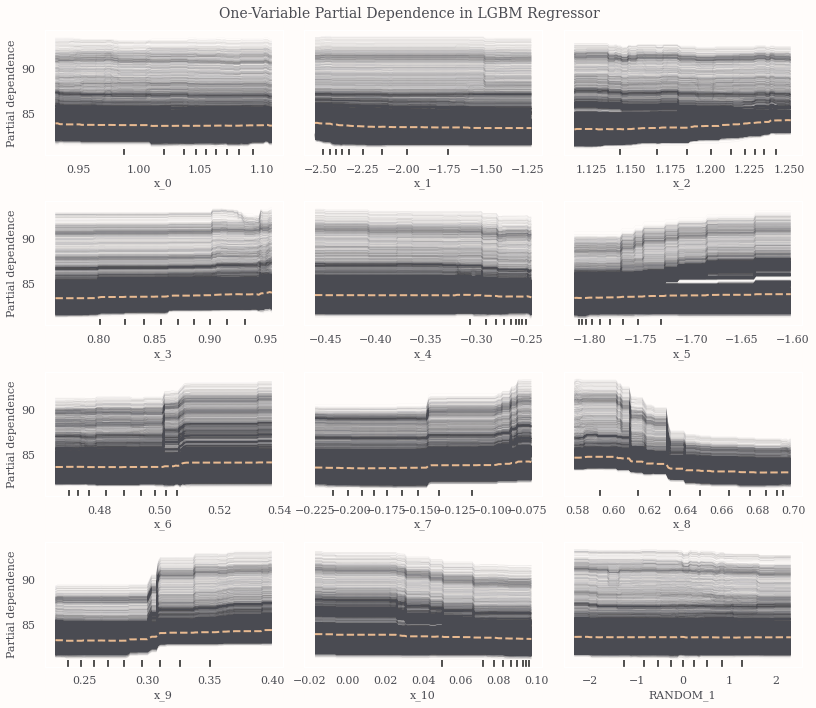

In [6]:
np.random.seed(42)

X = train.drop("y", axis=1).assign(RANDOM_1=np.random.normal(size=len(train)))
y = train.y

lgbm = DefaultLGBMRegressor().fit(X, y)

fig, axes = plt.subplots(4, 3, figsize=(11.5, 10), tight_layout=True, sharey=True)
plt.suptitle("One-Variable Partial Dependence in LGBM Regressor")
PartialDependenceDisplay.from_estimator(
    estimator=lgbm,  # type: ignore
    X=X,
    features=X.columns.tolist(),
    feature_names=X.columns.tolist(),
    response_method="auto",  # In regression, the response is `predict()` output.
    kind="both",  # PDP and ICE.
    percentiles=(0.01, 0.99),
    subsample=0.5,
    random_state=42,
    n_jobs=-1,
    ice_lines_kw={"color": COLOR_SCHEME[0], "linewidth": 0.2, "alpha": 0.1, "linestyle": "--"},
    pd_line_kw={"color": COLOR_SCHEME[2], "linewidth": 2.0},
    ax=axes.ravel(),  # type: ignore
)

for ax in axes.ravel():
    ax.get_legend().remove()
    if ax not in (axes[0, 0], axes[1, 0], axes[2, 0], axes[3, 0]):
        ax.set_ylabel("")

# plt.savefig("images/one_way_partial_dependence")
plt.show()

In [7]:
X = train.drop("y", axis=1)
y = train.y

transformer = PowerTransformer(method="yeo-johnson", standardize=True)
X_rescaled = transformer.fit_transform(X)

pca_2d = PCA(n_components=2, random_state=42)
iso_2d = Isomap(n_components=2, n_neighbors=20, n_jobs=-1)
tsne_2d = TSNE(n_components=2, random_state=42, n_jobs=-1)

pca_2d_results = pd.DataFrame(pca_2d.fit_transform(X_rescaled), columns=("x1", "x2")).join(y)
iso_2d_results = pd.DataFrame(iso_2d.fit_transform(X_rescaled), columns=("x1", "x2")).join(y)
tsne_2d_results = pd.DataFrame(tsne_2d.fit_transform(X_rescaled), columns=("x1", "x2")).join(y)

MemoryError: Unable to allocate 12.0 GiB for an array with shape (40118, 40118) and data type float64

In [8]:
def remove_outliers(data, detector):
    if not isinstance(data, pd.DataFrame):
        raise TypeError(f"'data' must be {pd.DataFrame!r} instance")

    result = detector.fit_predict(data)
    outlier_ids = pd.Series(result == -1, index=data.index, dtype=bool)
    data_ids = pd.Series(np.ones_like(data.index), index=data.index, dtype=bool)
    
    return data[~(outlier_ids & data_ids)]

In [9]:
lgbm = DefaultLGBMRegressor()
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
detector = make_pipeline(
    PowerTransformer(method="yeo-johnson", standardize=True),
    LocalOutlierFactor(),
)

hyperparameter = "localoutlierfactor__contamination"
hyperparameter_values = [None] + np.arange(0.01, 0.15, 0.01).tolist()
no_outliers_medae = {}

for k, (train_ids, valid_ids) in enumerate(kfold.split(X, y), start=1):
    X_train, y_train = X.iloc[train_ids], y.iloc[train_ids]
    X_valid, y_valid = X.iloc[valid_ids], y.iloc[valid_ids]

    lgbm.fit(X_train, y_train)
    default_medae = median_absolute_error(y_valid, lgbm.predict(X_valid))  # type:ignore

    for hp_value in hyperparameter_values:
        if hp_value is None:
            no_outliers_medae[f"0 - {k}"] = default_medae
            continue

        detector.set_params(**{hyperparameter: hp_value})
        X_no_outliers = remove_outliers(X_train, detector)
        y_no_outliers = y_train[X_no_outliers.index]

        lgbm.fit(X_no_outliers, y_no_outliers)
        clean_medae = median_absolute_error(y_valid, lgbm.predict(X_valid))  # type:ignore
        no_outliers_medae[f"{hp_value} - {k}"] = clean_medae

In [10]:
detector_medae = pd.DataFrame({"KEY": no_outliers_medae.keys(), "MedAE": no_outliers_medae.values()})
detector_medae[[hyperparameter, "Fold"]] = detector_medae.KEY.str.split("-", expand=True)
default_medae = detector_medae[detector_medae[hyperparameter].astype(float) == 0].MedAE

fig = px.line(
    detector_medae,
    x=hyperparameter,
    y="MedAE",
    facet_row="Fold",
    facet_row_spacing=0.07,
    color_discrete_sequence=COLOR_SCHEME[2:],
    height=640,
    width=840,
    title=f"Influence of '{hyperparameter}' Hyperparameter on MedAE in LGBM<br>"
    "<span style='font-size: 75%; font-weight: bold;'>"
    f"None of the '{hyperparameter}' values causes "
    "a reduction in MedAE in all folds</span>",
)
for fold, fold_default_medae in enumerate(default_medae):
    fig.add_hline(
        fold_default_medae,
        annotation_text=f"<b>Default MedAE: {fold_default_medae:.3f}</b>",
        annotation_position="bottom left",
        annotation_font_size=12,
        line_width=1.5,
        opacity=0.75,
        line_dash="dot",
        line_color=COLOR_SCHEME[0],
        row=len(default_medae) - fold,  # type:ignore
    )
fig.update_traces(line_width=2)
fig.update_layout(margin_pad=10)
fig.update_xaxes(tickformat=".2f", type="linear")
fig.show()
# save_and_show_fig(fig, "outlier_detection")

In [11]:
def clip_numeric_feature(X, lower_bound=None, upper_bound=None):
    X = np.array(X, copy=False)
    return np.clip(X[:, [0]], lower_bound, upper_bound)


def features_interaction(X, op="mul", eps=1e-9):
    ops = {
        "mul": operator.mul,
        "truediv": operator.truediv,
        "add": operator.add,
        "sub": operator.sub,
    }
    X = np.array(X, copy=False)
    return ops.get(op, operator.mul)(X[:, [0]], X[:, [1]] + eps)


def interaction_name(function_transformer, feature_names_in, name):
    return [name]  # feature names out

In [23]:
preprocessing = make_pipeline(
    make_column_transformer(
        (
            FunctionTransformer(
                clip_numeric_feature,
                feature_names_out="one-to-one",
                kw_args=dict(lower_bound=0, upper_bound=1894),
            ),
            ["x_7"],
        ),
        (
            FunctionTransformer(
                clip_numeric_feature,
                feature_names_out="one-to-one",
                kw_args=dict(lower_bound=0, upper_bound=236),
            ),
            ["x_8"],
        ),
        remainder="passthrough",
        verbose_feature_names_out=True,
    ),
    PowerTransformer(method="yeo-johnson", standardize=True),
    # FeatureAgglomeration(n_clusters=3, linkage="complete"),
)

In [14]:
class FeatureFromModel(
    MetaEstimatorMixin,  # Accepts any regressor
    BaseEstimator,  # `set_params()` and `get_params()`
    TransformerMixin,  # `fit_transform()`
    ClassNamePrefixFeaturesOutMixin,  # `get_feature_names_out()`
):
    def __init__(self, estimator):
        self.estimator = estimator

    def fit(self, X, y):
        check_array(X)
        self.estimator_ = clone(self.estimator).fit(X, y)
        self.n_features_in_ = self.estimator_.n_features_in_
        self._n_features_out = y.ndim
        if hasattr(self.estimator, "feature_names_in_"):
            self.feature_names_in_ = self.estimator.feature_names_in_
        return self

    def transform(self, X):
        check_is_fitted(self)
        check_array(X)
        y_pred = self.estimator_.predict(X)
        if y_pred.ndim == 1:
            return y_pred.reshape(-1, 1)
        return y_pred

In [15]:
def round_to_nearest(y, known_values=None, top_n=20):
    if known_values is None:
        known_values = y.value_counts().index.to_numpy()[:top_n]
    y_repeated = np.tile(y, reps=(len(known_values), 1)).transpose()
    lowest_diff_ids = np.abs(y_repeated - known_values).argmin(axis=1)
    return known_values[lowest_diff_ids]

In [25]:
X = train.drop("y", axis=1)
y = train.y
y_oof = np.zeros_like(y)

kfold = KFold(n_splits=10, shuffle=True, random_state=42)
knn = make_pipeline(
    FeatureFromModel(KNeighborsRegressor(n_neighbors=100)),
    MinMaxScaler(),
)
lgb = LGBMRegressor(
    objective="regression_l1",
    min_child_samples=100,
    reg_alpha=20,
    reg_lambda=20,
    verbose=-1,
)

for fold, (train_ids, valid_ids) in enumerate(kfold.split(X, y), start=1):
    X_train, y_train = X.iloc[train_ids], y.iloc[train_ids]
    X_valid, y_valid = X.iloc[valid_ids], y.iloc[valid_ids]

    # X_train = preprocessing.fit_transform(X_train)
    # X_valid = preprocessing.transform(X_valid)

    X_train = np.c_[X_train, knn.fit_transform(X_train, round_to_nearest(y_train, top_n=10))]
    X_valid = np.c_[X_valid, knn.transform(X_valid)]

    lgb.fit(X_train, round_to_nearest(y_train, top_n=30))
    y_pred = lgb.predict(X_valid).round(2)  # type: ignore
    y_oof[valid_ids] = y_pred
    medae = median_absolute_error(y_valid, y_pred)  # type: ignore

    print(CLR + f"Fold: {fold:2d}", CLR + "- MedAE:", RED + f"{medae:.3f}")

Fold:  1 - MedAE: 0.929
Fold:  2 - MedAE: 0.952
Fold:  3 - MedAE: 1.011
Fold:  4 - MedAE: 0.941
Fold:  5 - MedAE: 0.898
Fold:  6 - MedAE: 0.941
Fold:  7 - MedAE: 0.932
Fold:  8 - MedAE: 0.958
Fold:  9 - MedAE: 0.932
Fold: 10 - MedAE: 0.928


In [18]:
fig = make_subplots(rows=1, cols=2, horizontal_spacing=0.1)

fig.add_histogram(
    x=np.abs(y - y_oof),
    xbins=go.histogram.XBins(size=0.2),
    showlegend=False,
    row=1,
    col=1,
)
fig.update_xaxes(title="Absolute Error", range=(-0.5, 6), row=1, col=1)
fig.update_yaxes(title="Count", row=1, col=1)
fig.add_scatter(
    x=y,
    y=y_oof,
    mode="markers",
    showlegend=True,
    name="Predictions",
    marker=dict(symbol="x", size=2, color=COLOR_SCHEME[0]),
    row=1,
    col=2,
)
fig.add_scatter(x=[1, 10], y=[1, 10], name="Perfectly Predicted", mode="lines", row=1, col=2)
fig.update_yaxes(title="Predicted 'Hardness'", row=1, col=2)
fig.update_xaxes(title="True 'Hardness'", row=1, col=2)
fig.update_layout(
    title="Training Dataset - Out-of-Fold Predictions via Regression Approach<br>"
    "<span style='font-size: 75%; font-weight: bold;'>",
    height=460,
    width=840,
    bargap=0.2,
    legend=dict(y=1.02, x=1),
)
fig.show()

In [27]:
y_train = train.y
X_train = train.drop("y", axis=1)
X_train = np.c_[X_train, knn.fit_transform(X_train, round_to_nearest(y_train, top_n=10))]

X_test = test
X_test = np.c_[X_test, knn.transform(X_test)]

lgb.fit(X_train, round_to_nearest(y_train, top_n=30))

submission = pd.DataFrame(
    {
        "ID": test.index,
        "y": lgb.predict(X_test).round(2),  # type:ignore
    }
).set_index("ID")

submission.to_csv("submission_reg.csv")
get_pretty_frame(submission.head(), precision=2)

,y
ID,
TEST_0000,83.50
TEST_0001,82.20
TEST_0002,86.46
TEST_0003,86.46
TEST_0004,82.18


In [28]:
X = train.drop("y", axis=1)
y = train.y
y_oof = np.zeros_like(y)

cats = np.array([1.75, 2.55, 3.75, 4.75, 5.75, 6.55, 7.75, 8.75, 9.75])
encoder = LabelEncoder()
rskf_cats = encoder.fit_transform(round_to_nearest(y, cats))

lgb = LGBMClassifier(random_state=42, max_depth=3, verbose=-1)
xgb = XGBClassifier(random_state=42, max_depth=3)

rskf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

for fold, (train_ids, valid_ids) in enumerate(rskf.split(X, rskf_cats), start=1):
    X_train, y_train = X.iloc[train_ids], y.iloc[train_ids]
    X_valid, y_valid = X.iloc[valid_ids], y.iloc[valid_ids]

    y_train = encoder.fit_transform(round_to_nearest(y_train, cats))
    # X_train = preprocessing.fit_transform(X_train)
    # X_valid = preprocessing.transform(X_valid)

    lgb.fit(X_train, y_train)  # type: ignore
    xgb.fit(X_train, y_train)

    lgb_proba = lgb.predict_proba(X_valid)
    xgb_proba = xgb.predict_proba(X_valid)

    y_cat = np.argmax(lgb_proba + xgb_proba, axis=1)
    y_pred = encoder.inverse_transform(y_cat)
    y_oof[valid_ids] = y_pred

    medae = median_absolute_error(y_valid, y_pred)
    print(CLR + f"Fold: {fold:2d}", CLR + "- MedAE:", RED + f"{medae:.3f}")

Fold:  1 - MedAE: 73.490
Fold:  2 - MedAE: 73.497
Fold:  3 - MedAE: 73.565
Fold:  4 - MedAE: 73.477
Fold:  5 - MedAE: 73.509
Fold:  6 - MedAE: 73.555
Fold:  7 - MedAE: 73.532
Fold:  8 - MedAE: 73.544
Fold:  9 - MedAE: 73.539
Fold: 10 - MedAE: 73.605


In [30]:
cats = np.array([1.75, 2.55, 3.75, 4.75, 5.75, 6.55, 7.75, 8.75, 9.75])
encoder = LabelEncoder()

X_train = train.drop("y", axis=1)
X_test = test
y_train = encoder.fit_transform(round_to_nearest(train.y, cats))

lgb = LGBMClassifier(random_state=42, max_depth=3, verbose=-1)
xgb = XGBClassifier(random_state=42, max_depth=3)

lgb.fit(X_train, y_train)  # type: ignore
xgb.fit(X_train, y_train)

lgb_proba = lgb.predict_proba(X_test)
xgb_proba = xgb.predict_proba(X_test)

y_cat = np.argmax(lgb_proba + xgb_proba, axis=1)
y_pred = encoder.inverse_transform(y_cat)

submission = pd.DataFrame(
    {
        "ID": test.index,
        "y": y_pred,
    }
).set_index("ID")

submission.to_csv("submission_classif.csv")
get_pretty_frame(submission.head(), precision=2)

,y
ID,
TEST_0000,9.75
TEST_0001,9.75
TEST_0002,9.75
TEST_0003,9.75
TEST_0004,9.75
